# Projeto Final - MACHINE LEARNING
## Objetivo:
#### Implementar um modelo de regressão para prever o volume de precipitação de chuva diária na cidade de Belo Horizonte, utilizando dados metereológicos de cidades vizinhas

In [ ]:
!pip install smogn

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeRegressor,  export_text, export_graphviz
from sklearn.feature_extraction import DictVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn import tree

import smogn

In [ ]:
# Carregando o DataFrame.
df = pd.read_excel(r'/content/df_final2.1 (2).xlsx')

In [ ]:
df.head()

,Data Medicao,PRESSAO ATMOSFERICA MEDIA(mB) - IBIRITE,TEMPERATURA DO PONTO DE ORVALHO MEDIA(Â°C) - IBIRITE,TEMPERATURA MAXIMA(Â°C) IBIRITE,TEMPERATURA MEDIA(Â°C) IBIRITE,TEMPERATURA MINIMA(Â°C) - IBIRITE,UMIDADE RELATIVA DO AR MEDIA(%) - IBIRITE,UMIDADE RELATIVA DO AR MINIMA(%) - IBIRITE,VENTO RAJADA MAXIMA(m/s) - IBIRITE,VENTO VELOCIDADE MEDIA(m/s) - IBIRITE,PRESSAO ATMOSFERICA MEDIA(mB) - ST,TEMPERATURA DO PONTO DE ORVALHO MEDIA(Â°C) - ST,TEMPERATURA MAXIMA(Â°C) - ST,TEMPERATURA MEDIA(Â°C) - ST,TEMPERATURA MINIMA(Â°C) - ST,UMIDADE RELATIVA DO AR MEDIA(%) - ST,UMIDADE RELATIVA DO AR MINIMA DIARIA(%) - ST,VENTO RAJADA MAXIMA DIARIA(m/s) - ST,VENTO VELOCIDADE MEDIA DIARIA(m/s) - ST,PRECIPITACAO TOTAL(mm) - BH
0,2020-07-01,882.143478,13.008696,23.5,17.539130,13.4,76.695652,50.0,10.9,1.956522,NaN,NaN,28.1,NaN,10.6,66.200000,38.0,10.7,NaN,0.0
1,2020-07-02,882.204167,12.925000,23.5,18.308333,15.3,71.708333,49.0,9.8,2.095833,NaN,NaN,28.2,NaN,14.0,67.000000,44.0,8.3,NaN,0.0
2,2020-07-03,883.683333,12.383333,22.8,17.662500,13.6,72.875000,43.0,11.7,1.525000,NaN,NaN,27.9,NaN,14.6,65.533333,32.0,9.2,NaN,2.2
3,2020-07-04,885.491667,12.591667,23.8,18.416667,15.5,70.000000,44.0,12.2,4.225000,NaN,NaN,29.2,NaN,13.8,60.666667,32.0,7.4,NaN,0.2
4,2020-07-05,886.887500,12.350000,23.3,17.491667,14.2,73.166667,46.0,13.1,5.516667,NaN,NaN,27.7,NaN,14.2,62.666667,34.0,7.2,NaN,0.0


In [ ]:
# Analisando as informações contidas no DataFrame.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1096 entries, 0 to 1095
Data columns (total 20 columns):
 #   Column                                                Non-Null Count  Dtype         
---  ------                                                --------------  -----         
 0   Data Medicao                                          1096 non-null   datetime64[ns]
 1   PRESSAO ATMOSFERICA MEDIA(mB) - IBIRITE               1064 non-null   float64       
 2   TEMPERATURA DO PONTO DE ORVALHO MEDIA(Â°C) - IBIRITE  1064 non-null   float64       
 3   TEMPERATURA MAXIMA(Â°C) IBIRITE                       1078 non-null   float64       
 4   TEMPERATURA MEDIA(Â°C) IBIRITE                        1036 non-null   float64       
 5   TEMPERATURA MINIMA(Â°C) - IBIRITE                     1079 non-null   float64       
 6   UMIDADE RELATIVA DO AR MEDIA(%) - IBIRITE             1082 non-null   float64       
 7   UMIDADE RELATIVA DO AR MINIMA(%) - IBIRITE            1086 non-null   float64 

# Tratamento dos dados

In [ ]:
#df.drop('Data Medicao', axis=1, inplace=True)

In [ ]:
#Criando faixas de valores da variável 'Data Medicao' e rotulá-las em estações do ano, por entender que a estação do ano teria relevância na análise de precipitação.
### Após realizar one hot enconding nessa coluna categórica e análise de importância, concluimos que essa informação não era relevante. Por isso, não seguimos com ela nos modelos.

In [ ]:
df['Data Medicao'] = df['Data Medicao'].dt.month

In [ ]:
faixas = [0, 4, 7, 10, 13]
rotulos = ['Verão','Outono', 'Inverno', 'Primavera']
df['Data Medicao'] = pd.cut(df['Data Medicao'], bins=faixas, labels=rotulos, right=False, include_lowest=True)

In [ ]:
df.rename(columns={'Data Medicao':'Estação'}, inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1096 entries, 0 to 1095
Data columns (total 20 columns):
 #   Column                                                Non-Null Count  Dtype   
---  ------                                                --------------  -----   
 0   Estação                                               1096 non-null   category
 1   PRESSAO ATMOSFERICA MEDIA(mB) - IBIRITE               1064 non-null   float64 
 2   TEMPERATURA DO PONTO DE ORVALHO MEDIA(Â°C) - IBIRITE  1064 non-null   float64 
 3   TEMPERATURA MAXIMA(Â°C) IBIRITE                       1078 non-null   float64 
 4   TEMPERATURA MEDIA(Â°C) IBIRITE                        1036 non-null   float64 
 5   TEMPERATURA MINIMA(Â°C) - IBIRITE                     1079 non-null   float64 
 6   UMIDADE RELATIVA DO AR MEDIA(%) - IBIRITE             1082 non-null   float64 
 7   UMIDADE RELATIVA DO AR MINIMA(%) - IBIRITE            1086 non-null   float64 
 8   VENTO RAJADA MAXIMA(m/s) - IBIRITE              

In [ ]:
# ----------------------- Preenchimento dos valor NaN -------------------------
# Utilizando o KNNImputer - é um método de imputação usado para tratar valores ausentes ou faltantes.

In [ ]:
from sklearn.impute import KNNImputer

In [ ]:
df_temp = pd.DataFrame(df.iloc[:, 1:20])

In [ ]:
# Inicializar o KNNImputer
knn_imputer = KNNImputer(n_neighbors=2)

# Aplicar o KNNImputer ao DataFrame para preencher os valores ausentes
df_filled = knn_imputer.fit_transform(df_temp)

# Transformar o array resultante de volta em um DataFrame
df_temp = pd.DataFrame(df_filled, columns=df_temp.columns)

In [ ]:
df_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1096 entries, 0 to 1095
Data columns (total 19 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   PRESSAO ATMOSFERICA MEDIA(mB) - IBIRITE               1096 non-null   float64
 1   TEMPERATURA DO PONTO DE ORVALHO MEDIA(Â°C) - IBIRITE  1096 non-null   float64
 2   TEMPERATURA MAXIMA(Â°C) IBIRITE                       1096 non-null   float64
 3   TEMPERATURA MEDIA(Â°C) IBIRITE                        1096 non-null   float64
 4   TEMPERATURA MINIMA(Â°C) - IBIRITE                     1096 non-null   float64
 5   UMIDADE RELATIVA DO AR MEDIA(%) - IBIRITE             1096 non-null   float64
 6   UMIDADE RELATIVA DO AR MINIMA(%) - IBIRITE            1096 non-null   float64
 7   VENTO RAJADA MAXIMA(m/s) - IBIRITE                    1096 non-null   float64
 8   VENTO VELOCIDADE MEDIA(m/s) - IBIRITE                 1096

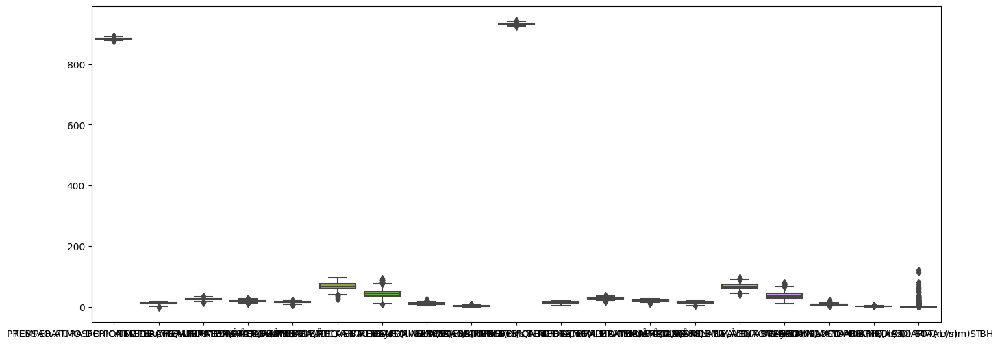

In [ ]:
# Gerando um boxplot para ver a distribuição dos dados. Como podemos ver quase não da pra ver as variáveis pois estão em uma escala diferente.
plt.figure(figsize=(16,6))
ax = sns.boxplot(data = df)

In [ ]:
# Transformando dados catégoricos em numericos(OneHotEncoding)

from sklearn.preprocessing import OneHotEncoder
#Aplicando o método OneHotEncoder nas colunas categoricas
encoder = OneHotEncoder(sparse_output=False)
temp_encoded = encoder.fit_transform(df[['Estação']])

df_encoded = pd.DataFrame(temp_encoded)

temp_encoded_df = pd.DataFrame(temp_encoded, columns=encoder.get_feature_names_out(['Estação']))
df_encoded = pd.concat([df_temp, temp_encoded_df], axis=1)

In [ ]:
df_encoded

,PRESSAO ATMOSFERICA MEDIA(mB) - IBIRITE,TEMPERATURA DO PONTO DE ORVALHO MEDIA(Â°C) - IBIRITE,TEMPERATURA MAXIMA(Â°C) IBIRITE,TEMPERATURA MEDIA(Â°C) IBIRITE,TEMPERATURA MINIMA(Â°C) - IBIRITE,UMIDADE RELATIVA DO AR MEDIA(%) - IBIRITE,UMIDADE RELATIVA DO AR MINIMA(%) - IBIRITE,VENTO RAJADA MAXIMA(m/s) - IBIRITE,VENTO VELOCIDADE MEDIA(m/s) - IBIRITE,PRESSAO ATMOSFERICA MEDIA(mB) - ST,...,TEMPERATURA MINIMA(Â°C) - ST,UMIDADE RELATIVA DO AR MEDIA(%) - ST,UMIDADE RELATIVA DO AR MINIMA DIARIA(%) - ST,VENTO RAJADA MAXIMA DIARIA(m/s) - ST,VENTO VELOCIDADE MEDIA DIARIA(m/s) - ST,PRECIPITACAO TOTAL(mm) - BH,Estação_Inverno,Estação_Outono,Estação_Primavera,Estação_Verão
0,882.143478,13.008696,23.50,17.539130,13.40,76.695652,50.0,10.9,1.956522,934.870834,...,10.6,66.200000,38.0,10.7,1.435417,0.0,1.0,0.0,0.0,0.0
1,882.204167,12.925000,23.50,18.308333,15.30,71.708333,49.0,9.8,2.095833,933.495834,...,14.0,67.000000,44.0,8.3,1.400000,0.0,1.0,0.0,0.0,0.0
2,883.683333,12.383333,22.80,17.662500,13.60,72.875000,43.0,11.7,1.525000,935.920834,...,14.6,65.533333,32.0,9.2,2.125000,2.2,1.0,0.0,0.0,0.0
3,885.491667,12.591667,23.80,18.416667,15.50,70.000000,44.0,12.2,4.225000,934.660417,...,13.8,60.666667,32.0,7.4,1.435417,0.2,1.0,0.0,0.0,0.0
4,886.887500,12.350000,23.30,17.491667,14.20,73.166667,46.0,13.1,5.516667,935.837500,...,14.2,62.666667,34.0,7.2,2.860417,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1091,883.031250,13.706250,22.60,18.806250,14.20,71.750000,52.0,8.6,5.454166,937.691667,...,10.2,58.214286,38.0,7.9,1.508333,0.0,0.0,1.0,0.0,0.0
1092,885.518750,7.168750,23.90,17.241667,14.40,54.000000,34.0,9.2,2.683333,937.625000,...,8.9,64.625000,20.0,5.0,1.029167,0.0,0.0,1.0,0.0,0.0
1093,884.020833,6.895833,26.85,20.558333,15.90,42.062500,27.0,12.2,1.102083,937.690909,...,8.0,59.363636,23.0,7.9,1.363636,0.0,0.0,1.0,0.0,0.0
1094,883.567301,8.827445,25.40,18.365308,13.65,55.502718,34.0,14.5,4.537862,938.573913,...,13.1,59.565217,28.0,6.7,2.108696,0.0,0.0,1.0,0.0,0.0


## Oversampling

Nosso objetivo inicial era fazer um modelo de previsão do volume de precipitação de chuva MENSAL.
Porém, as bases de dados disponíveis eram bastante limitadas, com poucos registros. Então, alteramos para previsão DIÁRIA de chuva.
O ônus dessa mudança foi a presença massiva de dias sem chuva, ou seja, com volume igual a zero. Isso possivelmente enviesou bastante nosso modelo, fazendo-o retornar predições com r2 na faixa de 0,3~0,4.
Para minimizar esse efeito, utilizamos a técnica de amostragem SMOGN para balancear nossa variável dependente.

In [ ]:
# Utilizando o método smogn para o balanceamento de classes
df_smogn = smogn.smoter(df_encoded,
                        y='PRECIPITACAO TOTAL(mm) - BH',
                        k = 9,
                        samp_method = 'extreme',
                        rel_thres = 0.80,
                        rel_method = 'auto',
                        rel_xtrm_type = 'high',
                        rel_coef = 2.25)

r_index: 100%|##########| 51/51 [00:00<00:00, 398.81it/s]


In [ ]:
df_encoded = df_smogn

In [ ]:
df_encoded.iloc[:, 0:18]

,PRESSAO ATMOSFERICA MEDIA(mB) - IBIRITE,TEMPERATURA DO PONTO DE ORVALHO MEDIA(Â°C) - IBIRITE,TEMPERATURA MAXIMA(Â°C) IBIRITE,TEMPERATURA MEDIA(Â°C) IBIRITE,TEMPERATURA MINIMA(Â°C) - IBIRITE,UMIDADE RELATIVA DO AR MEDIA(%) - IBIRITE,UMIDADE RELATIVA DO AR MINIMA(%) - IBIRITE,VENTO RAJADA MAXIMA(m/s) - IBIRITE,VENTO VELOCIDADE MEDIA(m/s) - IBIRITE,PRESSAO ATMOSFERICA MEDIA(mB) - ST,TEMPERATURA DO PONTO DE ORVALHO MEDIA(Â°C) - ST,TEMPERATURA MAXIMA(Â°C) - ST,TEMPERATURA MEDIA(Â°C) - ST,TEMPERATURA MINIMA(Â°C) - ST,UMIDADE RELATIVA DO AR MEDIA(%) - ST,UMIDADE RELATIVA DO AR MINIMA DIARIA(%) - ST,VENTO RAJADA MAXIMA DIARIA(m/s) - ST,VENTO VELOCIDADE MEDIA DIARIA(m/s) - ST
0,882.239771,16.894078,27.049686,20.915474,17.750943,78.630983,55.583857,12.023585,2.357604,931.200360,18.809141,31.083229,22.937297,18.642243,79.786540,43.167715,12.283229,2.265867
1,881.836301,17.172145,26.943826,20.948049,18.097288,80.061683,54.849394,10.410993,2.085329,930.843888,18.894675,30.367167,22.878919,18.726053,80.252603,45.438257,11.337046,2.133063
2,884.863076,14.787630,24.987940,19.694060,16.419038,74.238482,51.686314,12.887127,2.407472,934.230149,17.232252,28.387940,21.205959,15.700542,68.821505,45.436992,6.687940,1.438149
3,884.820826,14.521357,24.423261,19.344097,16.117709,74.591548,52.704849,13.571539,2.546154,934.239754,16.982335,27.935418,20.779085,15.342024,67.711525,46.000000,6.329867,1.397414
4,881.536768,16.678583,27.307002,22.342669,18.349015,71.508753,46.509853,7.605031,1.018671,930.248438,18.218298,32.115975,23.523066,17.531069,69.009236,38.649895,5.584025,1.537537
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1088,886.788889,8.366667,21.200000,16.578261,12.100000,65.333333,40.000000,9.500000,0.338889,936.991667,10.066667,25.600000,15.237500,7.500000,60.333333,34.000000,6.200000,0.766667
1089,886.250000,9.502084,21.600000,16.037500,12.550000,68.923077,48.000000,7.500000,2.725000,937.741667,11.766667,24.300000,15.850000,9.000000,66.866667,40.000000,4.000000,0.820833
1090,887.772917,11.056250,25.050000,18.820833,15.050000,61.461538,38.000000,10.400000,3.102083,937.666667,9.061111,27.500000,17.683333,8.000000,52.846154,36.000000,6.400000,1.362500
1093,884.020833,6.895833,26.850000,20.558333,15.900000,42.062500,27.000000,12.200000,1.102083,937.690909,8.072727,27.900000,17.954545,8.000000,59.363636,23.000000,7.900000,1.363636


## Normalização

In [ ]:
df_scaler = pd.DataFrame(df_encoded.iloc[:, 0:18])

In [ ]:
df_scaler

,PRESSAO ATMOSFERICA MEDIA(mB) - IBIRITE,TEMPERATURA DO PONTO DE ORVALHO MEDIA(Â°C) - IBIRITE,TEMPERATURA MAXIMA(Â°C) IBIRITE,TEMPERATURA MEDIA(Â°C) IBIRITE,TEMPERATURA MINIMA(Â°C) - IBIRITE,UMIDADE RELATIVA DO AR MEDIA(%) - IBIRITE,UMIDADE RELATIVA DO AR MINIMA(%) - IBIRITE,VENTO RAJADA MAXIMA(m/s) - IBIRITE,VENTO VELOCIDADE MEDIA(m/s) - IBIRITE,PRESSAO ATMOSFERICA MEDIA(mB) - ST,TEMPERATURA DO PONTO DE ORVALHO MEDIA(Â°C) - ST,TEMPERATURA MAXIMA(Â°C) - ST,TEMPERATURA MEDIA(Â°C) - ST,TEMPERATURA MINIMA(Â°C) - ST,UMIDADE RELATIVA DO AR MEDIA(%) - ST,UMIDADE RELATIVA DO AR MINIMA DIARIA(%) - ST,VENTO RAJADA MAXIMA DIARIA(m/s) - ST,VENTO VELOCIDADE MEDIA DIARIA(m/s) - ST
0,882.239771,16.894078,27.049686,20.915474,17.750943,78.630983,55.583857,12.023585,2.357604,931.200360,18.809141,31.083229,22.937297,18.642243,79.786540,43.167715,12.283229,2.265867
1,881.836301,17.172145,26.943826,20.948049,18.097288,80.061683,54.849394,10.410993,2.085329,930.843888,18.894675,30.367167,22.878919,18.726053,80.252603,45.438257,11.337046,2.133063
2,884.863076,14.787630,24.987940,19.694060,16.419038,74.238482,51.686314,12.887127,2.407472,934.230149,17.232252,28.387940,21.205959,15.700542,68.821505,45.436992,6.687940,1.438149
3,884.820826,14.521357,24.423261,19.344097,16.117709,74.591548,52.704849,13.571539,2.546154,934.239754,16.982335,27.935418,20.779085,15.342024,67.711525,46.000000,6.329867,1.397414
4,881.536768,16.678583,27.307002,22.342669,18.349015,71.508753,46.509853,7.605031,1.018671,930.248438,18.218298,32.115975,23.523066,17.531069,69.009236,38.649895,5.584025,1.537537
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1088,886.788889,8.366667,21.200000,16.578261,12.100000,65.333333,40.000000,9.500000,0.338889,936.991667,10.066667,25.600000,15.237500,7.500000,60.333333,34.000000,6.200000,0.766667
1089,886.250000,9.502084,21.600000,16.037500,12.550000,68.923077,48.000000,7.500000,2.725000,937.741667,11.766667,24.300000,15.850000,9.000000,66.866667,40.000000,4.000000,0.820833
1090,887.772917,11.056250,25.050000,18.820833,15.050000,61.461538,38.000000,10.400000,3.102083,937.666667,9.061111,27.500000,17.683333,8.000000,52.846154,36.000000,6.400000,1.362500
1093,884.020833,6.895833,26.850000,20.558333,15.900000,42.062500,27.000000,12.200000,1.102083,937.690909,8.072727,27.900000,17.954545,8.000000,59.363636,23.000000,7.900000,1.363636


In [ ]:
#------------------- Normalização ------------------------
# Normalizando os dados utilizando o método:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
scaler = StandardScaler()
#scaler = MinMaxScaler()

In [ ]:
normalize = scaler.fit_transform(df_scaler)
X = pd.DataFrame(normalize)
y = df_smogn['PRECIPITACAO TOTAL(mm) - BH']

In [ ]:
X

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,-0.341762,0.767479,0.687833,0.530275,0.680151,0.425155,0.272066,0.144979,-0.126877,-0.451996,0.649590,0.911525,0.529822,0.531233,0.610367,-0.107196,1.452248,0.700702
1,-0.505427,0.857221,0.649278,0.546143,0.852639,0.546142,0.222511,-0.405963,-0.292166,-0.583872,0.673906,0.638801,0.502971,0.555959,0.654251,0.056527,1.058593,0.442689
2,0.722366,0.087653,-0.063081,-0.064708,0.016834,0.053702,0.009095,0.440009,-0.096604,0.668865,0.201300,-0.115021,-0.266491,-0.336653,-0.422089,0.056436,-0.875643,-0.907396
3,0.705227,0.001718,-0.268744,-0.235185,-0.133235,0.083559,0.077816,0.673838,-0.012414,0.672419,0.130252,-0.287371,-0.462827,-0.442426,-0.526603,0.097033,-1.024618,-0.986536
4,-0.626931,0.697931,0.781551,1.225499,0.978004,-0.177139,-0.340166,-1.364619,-0.939699,-0.804157,0.481620,1.304864,0.799240,0.203405,-0.404412,-0.432965,-1.334921,-0.714304
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1407,1.503560,-1.984620,-1.442697,-1.582497,-2.134141,-0.699365,-0.779393,-0.717203,-1.352372,1.690481,-1.835786,-1.176855,-3.011626,-2.756049,-1.221326,-0.768258,-1.078648,-2.211958
1408,1.284963,-1.618181,-1.297012,-1.845916,-1.910031,-0.395797,-0.239625,-1.400503,0.096157,1.967941,-1.352497,-1.671982,-2.729912,-2.313506,-0.606154,-0.335612,-1.993947,-2.106724
1409,1.902725,-1.116596,-0.040478,-0.490080,-0.664977,-1.026785,-0.914335,-0.409718,0.325072,1.940195,-2.121653,-0.453208,-1.886689,-2.608535,-1.926311,-0.624042,-0.995439,-1.054368
1410,0.380715,-2.459310,0.615105,0.356302,-0.241658,-2.667270,-1.656516,0.205252,-0.889062,1.949164,-2.402638,-0.300861,-1.761947,-2.608535,-1.312632,-1.561440,-0.371372,-1.052161


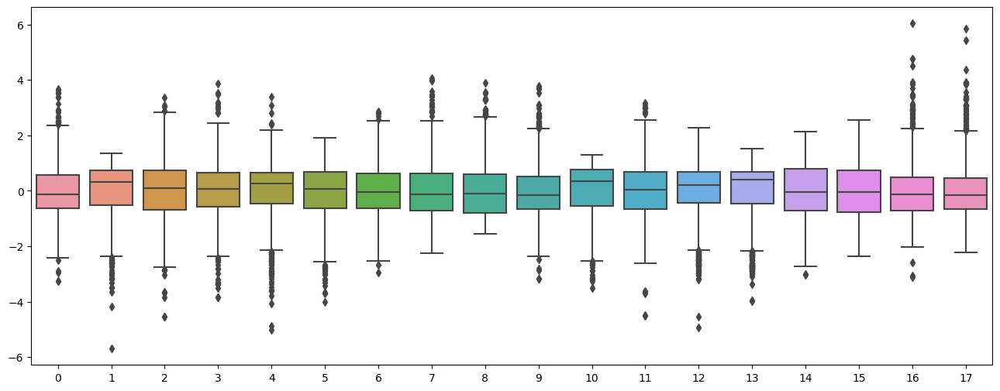

In [ ]:
# Visualizando o boxplot com os dados normalizados.
plt.figure(figsize=(16,6))
ax = sns.boxplot(data = X)

In [ ]:
y

0       2.223529
1       1.768421
2       1.866667
3       2.167742
4       1.493333
          ...   
1088    0.000000
1089    0.000000
1090    0.000000
1093    0.000000
1095    0.000000
Name: PRECIPITACAO TOTAL(mm) - BH, Length: 1412, dtype: float64

In [ ]:
X_final = pd.concat([X, temp_encoded_df], axis=1)
X_final

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,Estação_Inverno,Estação_Outono,Estação_Primavera,Estação_Verão
0,-0.341762,0.767479,0.687833,0.530275,0.680151,0.425155,0.272066,0.144979,-0.126877,-0.451996,...,0.529822,0.531233,0.610367,-0.107196,1.452248,0.700702,1.0,0.0,0.0,0.0
1,-0.505427,0.857221,0.649278,0.546143,0.852639,0.546142,0.222511,-0.405963,-0.292166,-0.583872,...,0.502971,0.555959,0.654251,0.056527,1.058593,0.442689,1.0,0.0,0.0,0.0
2,0.722366,0.087653,-0.063081,-0.064708,0.016834,0.053702,0.009095,0.440009,-0.096604,0.668865,...,-0.266491,-0.336653,-0.422089,0.056436,-0.875643,-0.907396,1.0,0.0,0.0,0.0
3,0.705227,0.001718,-0.268744,-0.235185,-0.133235,0.083559,0.077816,0.673838,-0.012414,0.672419,...,-0.462827,-0.442426,-0.526603,0.097033,-1.024618,-0.986536,1.0,0.0,0.0,0.0
4,-0.626931,0.697931,0.781551,1.225499,0.978004,-0.177139,-0.340166,-1.364619,-0.939699,-0.804157,...,0.799240,0.203405,-0.404412,-0.432965,-1.334921,-0.714304,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1407,1.503560,-1.984620,-1.442697,-1.582497,-2.134141,-0.699365,-0.779393,-0.717203,-1.352372,1.690481,...,-3.011626,-2.756049,-1.221326,-0.768258,-1.078648,-2.211958,NaN,NaN,NaN,NaN
1408,1.284963,-1.618181,-1.297012,-1.845916,-1.910031,-0.395797,-0.239625,-1.400503,0.096157,1.967941,...,-2.729912,-2.313506,-0.606154,-0.335612,-1.993947,-2.106724,NaN,NaN,NaN,NaN
1409,1.902725,-1.116596,-0.040478,-0.490080,-0.664977,-1.026785,-0.914335,-0.409718,0.325072,1.940195,...,-1.886689,-2.608535,-1.926311,-0.624042,-0.995439,-1.054368,NaN,NaN,NaN,NaN
1410,0.380715,-2.459310,0.615105,0.356302,-0.241658,-2.667270,-1.656516,0.205252,-0.889062,1.949164,...,-1.761947,-2.608535,-1.312632,-1.561440,-0.371372,-1.052161,NaN,NaN,NaN,NaN


In [ ]:
y_final = df_temp.iloc[:,18]
y_final

0       0.0
1       0.0
2       2.2
3       0.2
4       0.0
       ... 
1091    0.0
1092    0.0
1093    0.0
1094    0.0
1095    0.0
Name: PRECIPITACAO TOTAL(mm) - BH, Length: 1096, dtype: float64

In [ ]:
X_final.columns = X_final.columns.astype(str)
X.columns = X.columns.astype(str)

In [ ]:
X_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   0                  1412 non-null   float64
 1   1                  1412 non-null   float64
 2   2                  1412 non-null   float64
 3   3                  1412 non-null   float64
 4   4                  1412 non-null   float64
 5   5                  1412 non-null   float64
 6   6                  1412 non-null   float64
 7   7                  1412 non-null   float64
 8   8                  1412 non-null   float64
 9   9                  1412 non-null   float64
 10  10                 1412 non-null   float64
 11  11                 1412 non-null   float64
 12  12                 1412 non-null   float64
 13  13                 1412 non-null   float64
 14  14                 1412 non-null   float64
 15  15                 1412 non-null   float64
 16  16                 1412 

##### Analisando a Importância dos atributos - ExtraTreesRegressor

In [ ]:
# Visualizando a impotância dos atributos com o ExtraTreesRegressor
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt

In [ ]:
regressor = ExtraTreesRegressor()

In [ ]:
regressor.fit(X, y)

ExtraTreesRegressor()

In [ ]:
importances = regressor.feature_importances_

In [ ]:
df_importances = pd.DataFrame({'Atributos': X.columns, 'Importância': importances})
importances_df = df_importances.sort_values(by='Importância', ascending=False)
importances_df

,Atributos,Importância
14,14,0.126285
15,15,0.114006
5,5,0.108220
0,0,0.077899
6,6,0.058976
10,10,0.056312
9,9,0.054296
4,4,0.053027
7,7,0.050424
16,16,0.048431


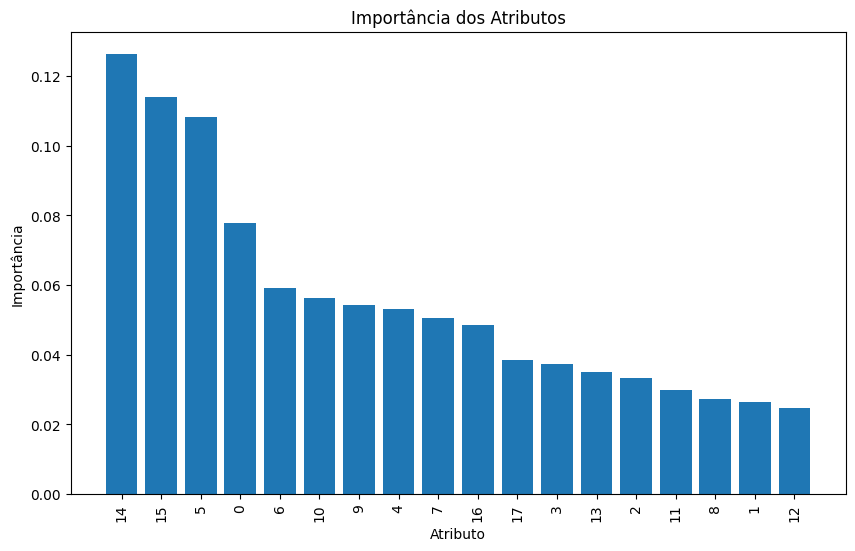

In [ ]:
plt.figure(figsize=(10, 6))
plt.bar(importances_df['Atributos'], importances_df['Importância'])
plt.xticks(rotation=90)
plt.xlabel('Atributo')
plt.ylabel('Importância')
plt.title('Importância dos Atributos')
plt.show()

###Treinando o Modelo - DecisionTreeRegressor

In [ ]:
# ------------------------- Treinando o Modelo -----------------------------------
# Separando as bases em treino e teste.
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [ ]:
#Construindo a arvore de decisão
treeTrain = DecisionTreeRegressor(random_state=0)

treeTrain = treeTrain.fit(X_train, y_train)
treeTrain

DecisionTreeRegressor(random_state=0)

In [ ]:
# Base de teste
y_pred = treeTrain.predict(X_test)
y_pred

array([ 15.33506494,   0.        ,   0.        ,   0.        ,
        12.3968254 ,   0.        ,  33.6       ,   5.74871795,
         2.18181818, 121.15519062,   7.7686747 ,   3.        ,
         8.02891566,   0.        ,   3.32307692,   0.        ,
        24.35265306,  34.28571429,   0.        ,  22.2       ,
         0.        ,   3.3       ,   5.4       ,   0.        ,
         8.4       ,   8.4       ,   0.        ,   0.        ,
        16.6       ,  18.33510796,   4.8       ,  56.97731239,
         6.4       ,   0.        ,   0.        ,  18.33510796,
        26.5080982 ,   0.2       ,   0.        ,   2.33333333,
        16.34285714,  27.00375066,   0.6       ,   3.01935484,
         0.        ,   7.8       ,   0.        ,   0.8       ,
         0.        ,   0.        ,  33.8       ,   3.32500515,
        28.83942172,  24.98486056,   6.4       ,  29.2       ,
         0.        ,   0.        ,  12.2       ,   9.70175439,
        22.2       ,   0.        ,  30.39868421,  34.94

In [ ]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("Mean Squared Error (MSE):", mse)
print("R-squared (R²):", r2)
print("Mean Absolute Error (MAE):", mae)

Mean Squared Error (MSE): 155.8020914213288
R-squared (R²): 0.3814931485180617
Mean Absolute Error (MAE): 4.855655918348786


In [ ]:
# Vizualizando a árvore de decisão
import pydotplus
from IPython.display import Image
import graphviz
dot_data = export_graphviz(treeTrain, out_file=None, feature_names=np.arange(0,18), filled=True, rounded=True)

# Converter o código DOT para uma imagem
graph = pydotplus.graph_from_dot_data(dot_data)

# Exibir a imagem da árvore de decisão usando o IPython.display
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.556665 to fit



### Ajustando os Hiperparâmetros - RandomizedSearchCV

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
param_dist = {
    'max_depth': [None, 5, 10, 17],
    'min_samples_split': np.arange(2, 15),
    'min_samples_leaf': np.arange(1, 15),
    'max_features': ['auto', 'sqrt']
}

In [ ]:
# Otimizando o modelo
n_iter_search = 1000

random_search = RandomizedSearchCV(treeTrain,
                                   param_distributions= param_dist,
                                   n_iter=n_iter_search,
                                   cv=3,
                                   n_jobs=-1,
                                   random_state=0)

In [ ]:
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=3, estimator=DecisionTreeRegressor(random_state=0),
                   n_iter=1000, n_jobs=-1,
                   param_distributions={'max_depth': [None, 5, 10, 17],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                                        'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])},
                   random_state=0)

In [ ]:
random_search.best_estimator_

DecisionTreeRegressor(max_features='sqrt', min_samples_leaf=2,
                      min_samples_split=5, random_state=0)

In [ ]:
randomTrain = random_search.best_estimator_

In [ ]:
y_pred2 = random_search.best_estimator_.predict(X_test)
mse = mean_squared_error(y_test, y_pred2)
r2 = r2_score(y_test, y_pred2)
mae = mean_absolute_error(y_test, y_pred2)
print("Mean Squared Error (MSE) do Melhor Modelo:", mse)
print("R-squared (R²) do Melhor Modelo:", r2)
print("Mean Absolute Error (MAE) do Melhor Modelo:", mae)

Mean Squared Error (MSE) do Melhor Modelo: 167.9890606179341
R-squared (R²) do Melhor Modelo: 0.3331130280836334
Mean Absolute Error (MAE) do Melhor Modelo: 5.682759606875038


In [ ]:
# Vizualizar a árvore depois do ajuste dos hiperparâmetros
dot_data = export_graphviz(randomTrain, out_file=None, feature_names=np.arange(0,18), filled=True, rounded=True)

# Converter o código DOT para uma imagem
graph = pydotplus.graph_from_dot_data(dot_data)

# Exibir a imagem da árvore de decisão usando o IPython.display
Image(graph.create_png())

### Utilizando o RandomForestRegressor

In [ ]:
# Utilizando o RandomForestRegressor para melhorar a qualidade do modelo.
clr = RandomForestRegressor(random_state=0)

clr = clr.fit(X_train, y_train)
y_pred_rf = clr.predict(X_test)


print("Regressor Random Forest:\n RandomForestClassifier(n_estimators=100)\n")
print("--------------------------------------")
print("R2 da base de treinamento: {:.2f}".format(clr.score(X_train, y_train)))
print("--------------------------------------")

print("--------------------------------------")
print("R2 da base de teste: {:.4f}".format(clr.score(X_test, y_test)))
print("--------------------------------------")

Regressor Random Forest:
 RandomForestClassifier(n_estimators=100)

--------------------------------------
R2 da base de treinamento: 0.96
--------------------------------------
--------------------------------------
R2 da base de teste: 0.7109
--------------------------------------


####Analisando a importância dos atributos do modelo RandomForestRegressor

In [ ]:
importances = clr.feature_importances_
df_importances = pd.DataFrame({'Atributos': X.columns, 'Importância': importances})
importances_df = df_importances.sort_values(by='Importância', ascending=False)
importances_df

,Atributos,Importância
14,14,0.392240
4,4,0.080163
0,0,0.075035
10,10,0.052553
16,16,0.050646
5,5,0.039604
9,9,0.039262
7,7,0.034452
17,17,0.032100
13,13,0.028703


###Ajustando os hiperparâmetros do modelo RandomForestRegressor
#####Utilizando o RandomizedSearchCV

In [ ]:
param_dist = {
    'n_estimators': [100, 200, 400],
    'criterion': ['squared_error', 'absolute_error'],
    'max_depth': [5, 10, 20, 40],
    'min_samples_split': np.arange(2, 11),
    'min_samples_leaf': np.arange(1, 11),
    'max_features': [None, 'sqrt', 'log2']
}

In [ ]:
# Otimizando o modelo
n_iter_search = 50

random_search = RandomizedSearchCV(clr,
                                   param_distributions= param_dist,
                                   n_iter=n_iter_search,
                                   cv=3,
                                   n_jobs = -1,
                                   random_state=0)

In [ ]:
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(random_state=0),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'criterion': ['squared_error',
                                                      'absolute_error'],
                                        'max_depth': [5, 10, 20, 40],
                                        'max_features': [None, 'sqrt', 'log2'],
                                        'min_samples_leaf': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
                                        'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10]),
                                        'n_estimators': [100, 200, 400]},
                   random_state=0)

In [ ]:
randomTrain = random_search.best_estimator_
random_search.best_estimator_

RandomForestRegressor(max_depth=20, max_features='log2', min_samples_split=3,
                      random_state=0)

In [ ]:
y_pred_rf2 = randomTrain.predict(X_test)

mse = mean_squared_error(y_test, y_pred_rf2)
r2 = r2_score(y_test, y_pred_rf2)
mae = mean_absolute_error(y_test, y_pred_rf2)
print("Mean Squared Error (MSE) do Melhor Modelo:", mse)
print("R-squared (R²) do Melhor Modelo:", r2)
print("Mean Absolute Error (MAE) do Melhor Modelo:", mae)

Mean Squared Error (MSE) do Melhor Modelo: 60.583691778403605
R-squared (R²) do Melhor Modelo: 0.7594934181487959
Mean Absolute Error (MAE) do Melhor Modelo: 4.6023101978224


(0.0, 200.0)

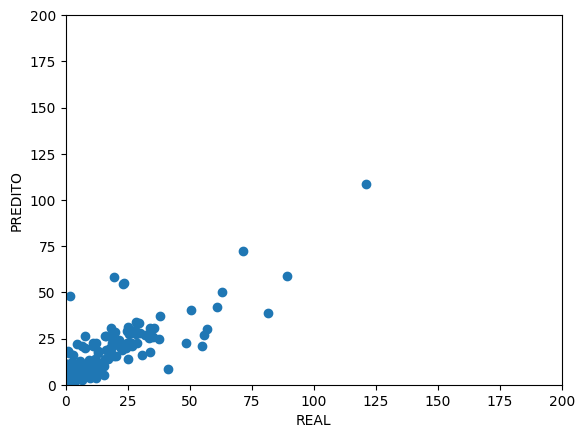

In [ ]:
# Gráfico dos dados Predito e Real.
plt.scatter(y_test, y_pred_rf)
plt.xlabel("REAL")
plt.ylabel("PREDITO")
plt.xlim(0, 200)
plt.ylim(0, 200)

In [ ]:
print("Random Forest:\n")
print("--------------------------------------")
print("R2 da base de treinamento: {:.2f}".format(randomTrain.score(X_train, y_train)))
print("--------------------------------------")

print("--------------------------------------")
print("R2 da base de teste: {:.2f}".format(randomTrain.score(X_test, y_test)))
print("--------------------------------------")

Random Forest:

--------------------------------------
R2 da base de treinamento: 0.96
--------------------------------------
--------------------------------------
R2 da base de teste: 0.76
--------------------------------------


### Resumo

Após utilizar o RandomForestRegressor analisamos que as metricas de avaliação do modelo obteve um bom desempenho na previsão do volume de precipitação de chuva diária em Belo Horizonte,

Mean Squared Error (MSE) do Melhor Modelo: 60.583691778403605

R-squared (R²) do Melhor Modelo: 0.7594934181487959

Mean Absolute Error (MAE) do Melhor Modelo: 4.6023101978224

Mas é claro que para uma maior confiabilidade dos resultado devemos analisar outras condições e fatores dos dados de clima que podem afetar significativamente a métrica do modelo.